In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5

In [ ]:
!pip install -qr requirements.txt
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets
torch.cuda.is_available()

In [ ]:
!pip install -q roboflow
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="roboflow-yolov5")

     |████████████████████████████████| 145 kB 7.3 MB/s 
     |████████████████████████████████| 178 kB 46.1 MB/s 
     |████████████████████████████████| 1.1 MB 61.7 MB/s 
     |████████████████████████████████| 67 kB 7.4 MB/s 
     |████████████████████████████████| 54 kB 3.5 MB/s 
     |████████████████████████████████| 138 kB 72.4 MB/s 
     |████████████████████████████████| 62 kB 1.7 MB/s 
upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=roboflow-yolov5


In [ ]:
%cd /content/yolov5
from roboflow import Roboflow
rf = Roboflow(api_key="")
project = rf.workspace("hcl").project("all_animals21")
dataset = project.version(1).download("yolov5")

/content/yolov5
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to all_animals21-1 in yolov5pytorch:: 100%|██████████| 34566/34566 [00:07<00:00, 4733.14it/s]


In [ ]:
%cat {dataset.location}/data.yaml

names:
- '0'
- '1'
- '10'
- '11'
- '12'
- '13'
- '14'
- '15'
- '16'
- '17'
- '18'
- '19'
- '2'
- '20'
- '3'
- '4'
- '5'
- '6'
- '7'
- '8'
- '9'
nc: 21
train: all_animals21-1/train/images
val: all_animals21-1/valid/images


In [ ]:
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=/content/yolov5/all_animals21-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 265 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 v6.1-306-gfbe67e4 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 266), started 3:59:02 ago. (Use '!kill 266' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
%ls runs/train/yolov5s_results2/weights

best.pt  last.pt


In [ ]:
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results2/weights/best.pt --img 416 --conf 0.4 --source "all_animals21-1/test/images"

/content/yolov5
detect: weights=['runs/train/yolov5s_results2/weights/best.pt'], source=all_animals21-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-306-gfbe67e4 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7300458 parameters, 0 gradients, 16.9 GFLOPs
image 1/3494 /content/yolov5/all_animals21-1/test/images/Bear_0155b267ade95d1e_jpg.rf.3b16b2354d55901bc755aa4e77018d29.jpg: 416x416 1 0, Done. (0.008s)
image 2/3494 /content/yolov5/all_animals21-1/test/images/Bear_02d4376234375c2f_jpg.rf.00391d6f5bb55d0c7b873ef49ae09e0a.jpg: 416x416 1 19, Done. (0.008s

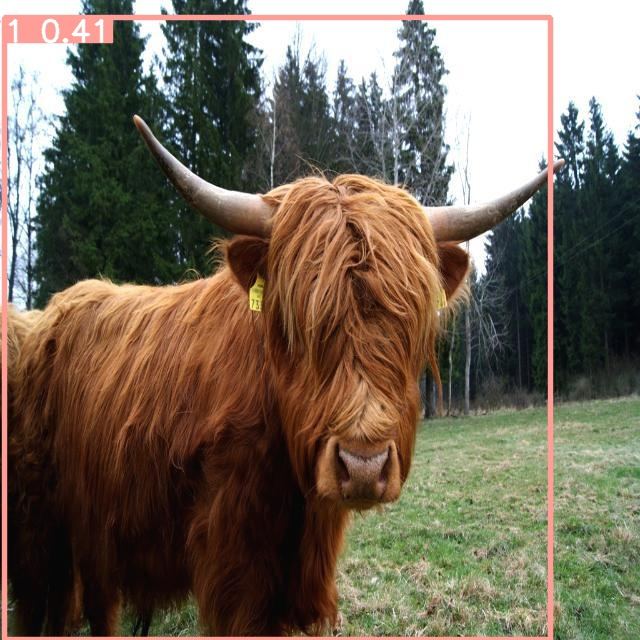

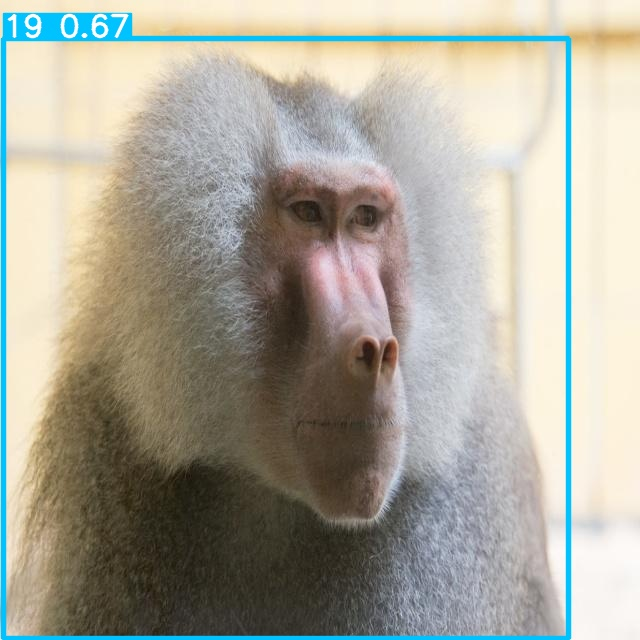

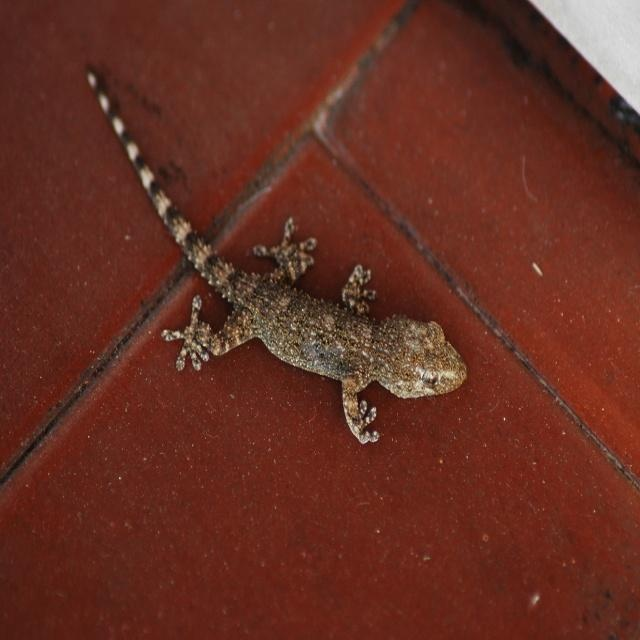

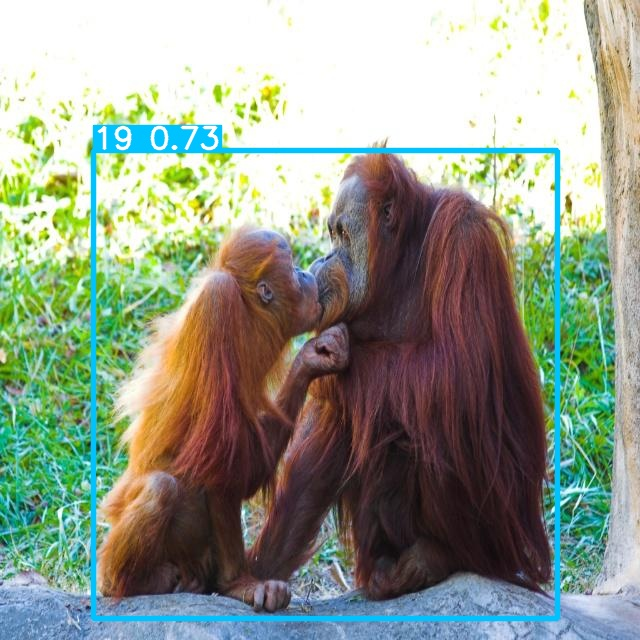

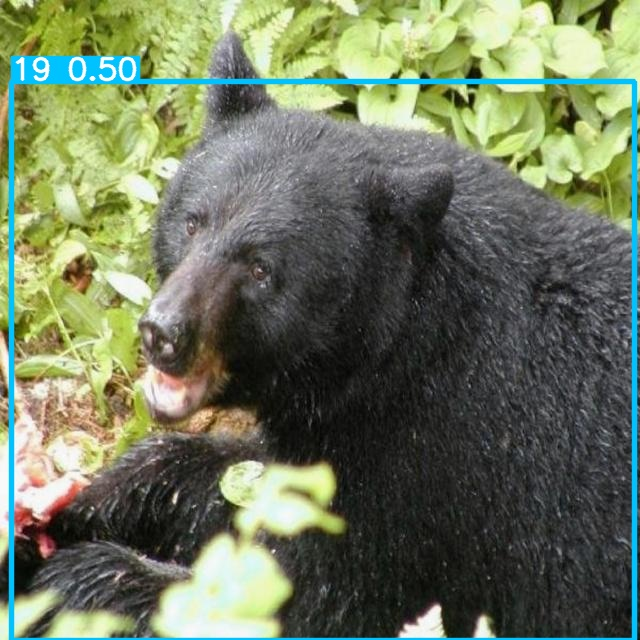

...

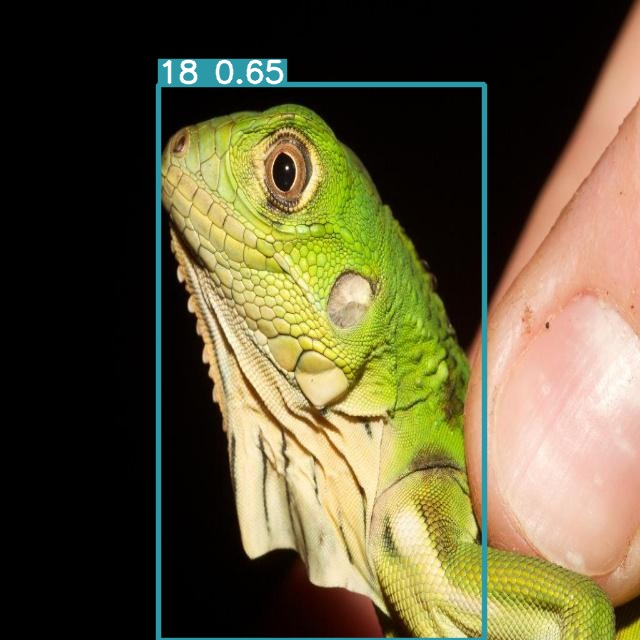

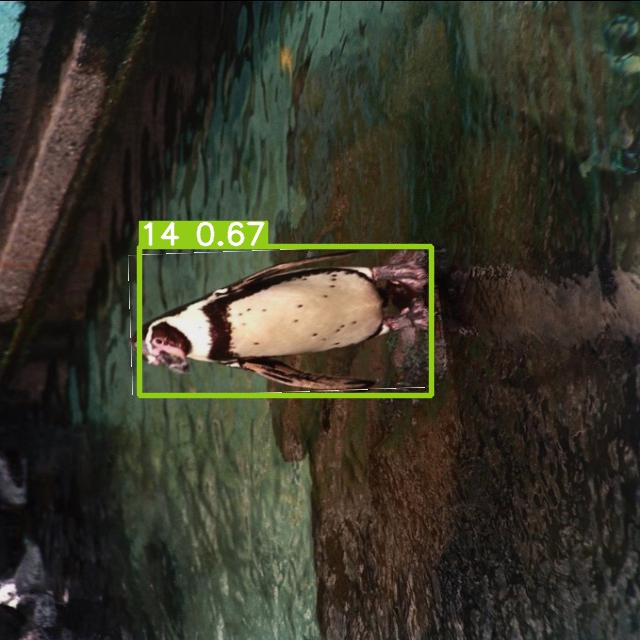

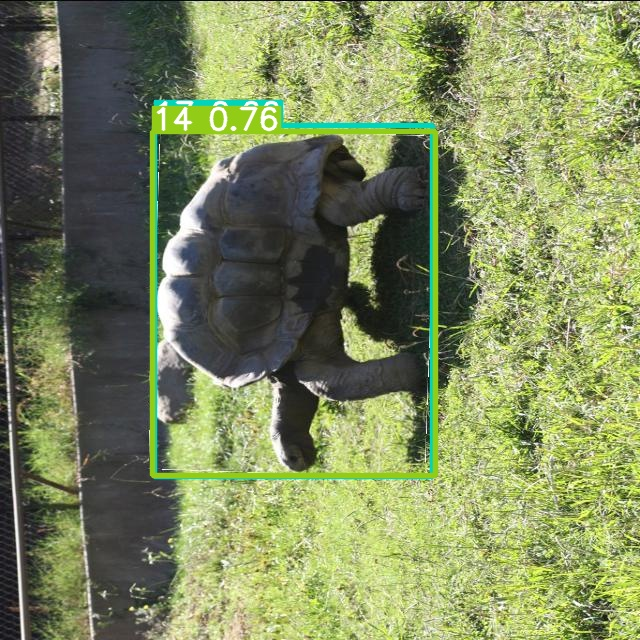

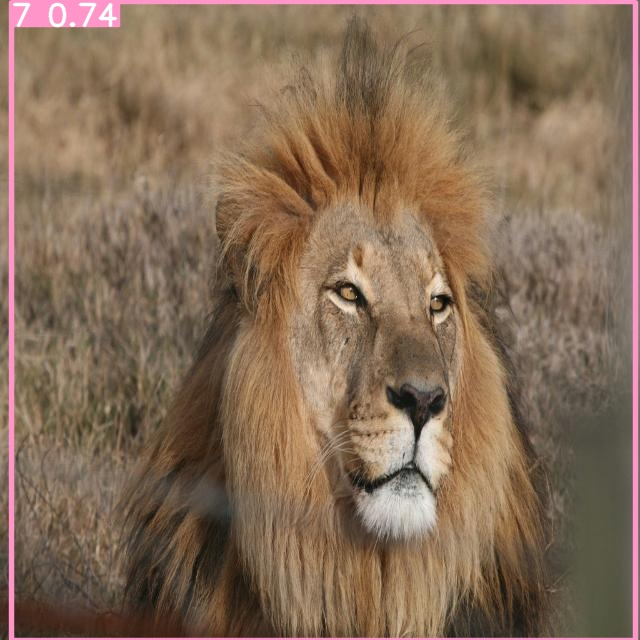

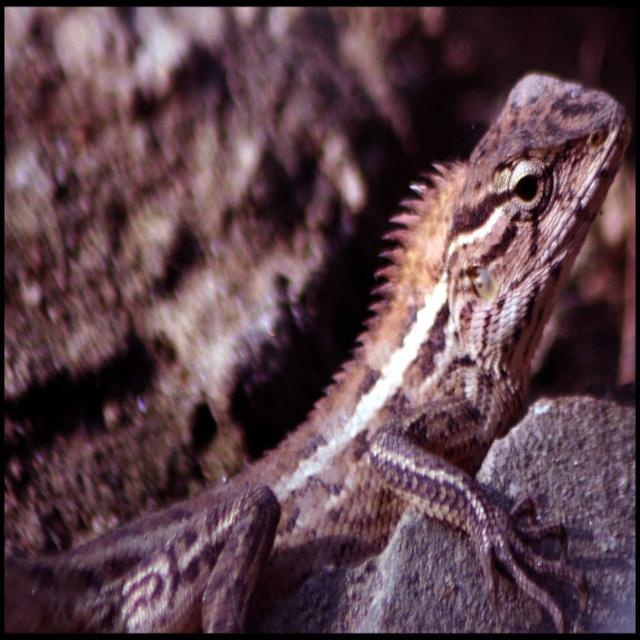

In [ ]:
import glob
from IPython.display import Image, display
from random import sample

# test_images = []
test_images = glob.glob('/content/yolov5/runs/detect/exp4/*.jpg')
for imageName in sample(test_images, 20): #assuming JPG

    display(Image(filename=imageName))
    print("\n")

### Saving weights

In [ ]:
%cd /content/yolov5/

!python export.py --weights runs/train/yolov5s_results2/weights/best.pt --include torchscript onnx

/content/yolov5
export: data=data/coco128.yaml, weights=['runs/train/yolov5s_results2/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, train=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript', 'onnx']
YOLOv5 🚀 v6.1-306-gfbe67e4 Python-3.7.14 torch-1.12.1+cu113 CPU

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7300458 parameters, 0 gradients, 16.9 GFLOPs

PyTorch: starting from runs/train/yolov5s_results2/weights/best.pt with output shape (1, 25200, 26) (14.2 MB)

TorchScript: starting export with torch 1.12.1+cu113...
TorchScript: export success, saved as runs/train/yolov5s_results2/weights/best.torchscript (28.4 MB)
requirements: onnx not found and is required by YOLOv5, attempting auto-update...
Looking in indexes: https://pypi.org/simple, https://us-

### Try loading model via onnx to save as keras
View model layers in detail

In [ ]:
import onnx

model = onnx.load("/content/yolov5/runs/train/yolov5s_results2/weights/best.onnx")
onnx.checker.check_model(model)

# Print a human readable representation of the graph
print(onnx.helper.printable_graph(model.graph))


graph torch_jit (
  %images[FLOAT, 1x3x640x640]
) initializers (
  %model.0.conv.conv.weight[FLOAT, 32x12x3x3]
  %model.0.conv.conv.bias[FLOAT, 32]
  %model.1.conv.weight[FLOAT, 64x32x3x3]
  %model.1.conv.bias[FLOAT, 64]
  %model.2.cv1.conv.weight[FLOAT, 32x64x1x1]
  %model.2.cv1.conv.bias[FLOAT, 32]
  %model.2.cv2.weight[FLOAT, 32x64x1x1]
  %model.2.cv3.weight[FLOAT, 32x32x1x1]
  %model.2.cv4.conv.weight[FLOAT, 64x64x1x1]
  %model.2.cv4.conv.bias[FLOAT, 64]
  %model.2.bn.weight[FLOAT, 64]
  %model.2.bn.bias[FLOAT, 64]
  %model.2.bn.running_mean[FLOAT, 64]
  %model.2.bn.running_var[FLOAT, 64]
  %model.2.m.0.cv1.conv.weight[FLOAT, 32x32x1x1]
  %model.2.m.0.cv1.conv.bias[FLOAT, 32]
  %model.2.m.0.cv2.conv.weight[FLOAT, 32x32x3x3]
  %model.2.m.0.cv2.conv.bias[FLOAT, 32]
  %model.3.conv.weight[FLOAT, 128x64x3x3]
  %model.3.conv.bias[FLOAT, 128]
  %model.4.cv1.conv.weight[FLOAT, 64x128x1x1]
  %model.4.cv1.conv.bias[FLOAT, 64]
  %model.4.cv2.weight[FLOAT, 64x128x1x1]
  %model.4.cv3.weight[FL

In [ ]:
!pip install onnx2keras

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for onnx2keras: filename=onnx2keras-0.0.24-py3-none-any.whl size=24593 sha256=cae55913dc61de5f28c4a8d9ddc3effcd1b494f2b534ff22c3f416019dd966d3
  Stored in directory: /root/.cache/pip/wheels/21/29/29/227fc9f8fed234b12169ae41f979cfadf1dcdbe1b370a5bbb5
Successfully built onnx2keras


In [ ]:
onnx_model = model

endpoint_names = ['image_tensor:0', 'output:0']

for i in range(len(onnx_model.graph.node)):
	for j in range(len(onnx_model.graph.node[i].input)):
		if ':' in onnx_model.graph.node[i].input[j]:
			print('-'*60)
			print(onnx_model.graph.node[i].name)
			print(onnx_model.graph.node[i].input)
			print(onnx_model.graph.node[i].output)

			onnx_model.graph.node[i].input[j] = onnx_model.graph.node[i].input[j].split(':')[-1]

	for j in range(len(onnx_model.graph.node[i].output)):
		if ':' in onnx_model.graph.node[i].output[j]:
			print('-'*60)
			print(onnx_model.graph.node[i].name)
			print(onnx_model.graph.node[i].input)
			print(onnx_model.graph.node[i].output)

			onnx_model.graph.node[i].output[j] = onnx_model.graph.node[i].output[j].split(':')[-1]

for i in range(len(onnx_model.graph.input)):
	if ':' in onnx_model.graph.input[i].name:
		print('-'*60)
		print(onnx_model.graph.input[i])
		onnx_model.graph.input[i].name = onnx_model.graph.input[i].name.split(':')[-1]

for i in range(len(onnx_model.graph.output)):
	if ':' in onnx_model.graph.output[i].name:
		print('-'*60)
		print(onnx_model.graph.output[i])
		onnx_model.graph.output[i].name = onnx_model.graph.output[i].name.split(':')[-1]

------------------------------------------------------------
Identity_0
['onnx::Reshape_562']
['onnx::Reshape_582']
------------------------------------------------------------
Identity_0
['Reshape_562']
['onnx::Reshape_582']
------------------------------------------------------------
Identity_1
['onnx::Reshape_562']
['onnx::Reshape_572']
------------------------------------------------------------
Identity_1
['Reshape_562']
['onnx::Reshape_572']
------------------------------------------------------------
Identity_2
['onnx::Resize_551']
['onnx::Resize_552']
------------------------------------------------------------
Identity_2
['Resize_551']
['onnx::Resize_552']
------------------------------------------------------------
Constant_3
[]
['onnx::Slice_169']
------------------------------------------------------------
Constant_4
[]
['onnx::Slice_170']
------------------------------------------------------------
Constant_5
[]
['onnx::Slice_171']
-----------------------------------------

In [ ]:
onnx_model.graph.input

[name: "images"
type {
  tensor_type {
    elem_type: 1
    shape {
      dim {
        dim_value: 1
      }
      dim {
        dim_value: 3
      }
      dim {
        dim_value: 640
      }
      dim {
        dim_value: 640
      }
    }
  }
}
]

In [ ]:
onnx.save(onnx_model, 'model.onnx')

In [ ]:
model = onnx.load('model.onnx')

In [ ]:
model.graph

In [ ]:
from onnx2keras import onnx_to_keras

k_model = onnx_to_keras(model,['images'], verbose = True)

k_model.summary()

INFO:onnx2keras:Converter is called.
Converter is called.


AttributeError: ignored

### Couldn't quite get onnx2keras to function properly